In [11]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import cv2

%matplotlib inline
test=pd.read_csv('test.csv')
train=pd.read_csv('train.csv')
sample=pd.read_csv('sample_submission.csv')

In [12]:
import os
folder_path = 'images'

files = [file for file in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, file))]

def show_image(path):
    img = cv2.imread(path)
    if img is not None:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img_rgb)
        plt.title(os.path.basename(path))
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print(f"Failed to load image: {path}")

In [13]:
for image_file in files:
    image_path = os.path.join(folder_path, image_file)
   

In [14]:
from tqdm import tqdm
IMAGE_PATH = folder_path + "/"

def load_image(image_id):
    file_path = image_id + ".jpg"
    image = cv2.imread(IMAGE_PATH + file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

tqdm.pandas()

SAMPLE_LEN = len(train)
train_images = train["image_id"][:SAMPLE_LEN].progress_apply(load_image)

100%|██████████| 1821/1821 [00:42<00:00, 42.89it/s]


## Distribution of Leaf Labels

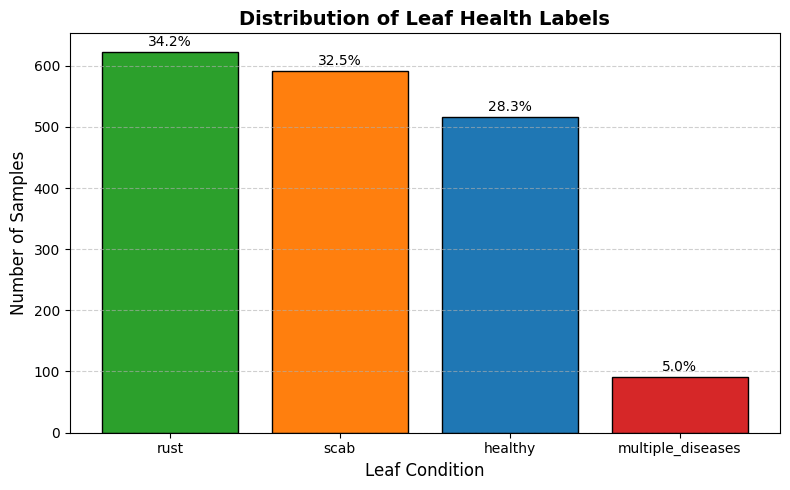

In [ ]:
LABEL_COLS = ['healthy', 'multiple_diseases', 'rust', 'scab']

label_counts = train[LABEL_COLS].idxmax(axis=1).value_counts().sort_values(ascending=False)
total = label_counts.sum()
colors = ['#2ca02c', '#ff7f0e', '#1f77b4', '#d62728']   
fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(label_counts.index, label_counts.values, color=colors, edgecolor='black')

ax.set_title("Distribution of Leaf Health Labels", fontsize=14, fontweight='bold')
ax.set_xlabel("Leaf Condition", fontsize=12)
ax.set_ylabel("Number of Samples", fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.6)

for bar in bars:
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2, 
        height + 5, 
        f"{(height / total) * 100:.1f}%", 
        ha='center', 
        va='bottom',
        fontsize=10
    )

plt.tight_layout()
plt.show()


## Analyzing Image dimensions

In [16]:
from PIL import Image
from collections import Counter
def get_size(df):
    hs, ws = [], []
    for _, row in tqdm(df.iterrows(), total=len(df)):
        img = Image.open(os.path.join(IMAGE_PATH, row.image_id + '.jpg'))
        h, w = img.size
        hs.append(h)
        ws.append(w)
    return hs, ws

In [17]:
train_heights, train_widths = get_size(train)
test_heights, test_widths = get_size(test)

100%|██████████| 1821/1821 [00:01<00:00, 1214.43it/s]


In [18]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2, subplot_titles=["Image Heights", "Image Widths"])

# Height distributions
fig.add_trace(go.Histogram(x=train_heights, name="Train Heights", opacity=0.5), row=1, col=1)
fig.add_trace(go.Histogram(x=test_heights, name="Test Heights", opacity=0.5), row=1, col=1)

# Width distributions
fig.add_trace(go.Histogram(x=train_widths, name="Train Widths", opacity=0.5), row=1, col=2)
fig.add_trace(go.Histogram(x=test_widths, name="Test Widths", opacity=0.5), row=1, col=2)

fig.update_layout(
    title="Train vs Test Image Size Distributions",
    barmode="overlay",
    width=900,
    height=400,
    legend=dict(x=0.5, y=-0.2, xanchor='center', orientation='h'),
    margin=dict(t=60, b=50)
)

fig.update_xaxes(title="Pixels")
fig.update_yaxes(title="Frequency")

fig.show()


## Display of color distributions of Train and Test Images

In [19]:
def display_color_distributions(dataframe, plot_title):
    import matplotlib.pyplot as plt
    import numpy as np
    import os
    from PIL import Image
    from tqdm import tqdm

    red_vals, green_vals, blue_vals, avg_vals = [], [], [], []

    for _, row in tqdm(dataframe.iterrows(), total=len(dataframe)):
        img_path = os.path.join(IMAGE_PATH, row.image_id + '.jpg')
        img = np.array(Image.open(img_path))
        
        red_vals.append(img[:, :, 0].mean())
        green_vals.append(img[:, :, 1].mean())
        blue_vals.append(img[:, :, 2].mean())
        avg_vals.append(img.mean())

    fig, axs = plt.subplots(1, 4, figsize=(20, 4), sharey=True)
    channel_data = [
        ("Red Channel", red_vals, "red"),
        ("Green Channel", green_vals, "green"),
        ("Blue Channel", blue_vals, "blue"),
        ("Overall Intensity", avg_vals, "gray")
    ]

    for ax, (label, values, color) in zip(axs, channel_data):
        ax.hist(values, bins=80, color=color, alpha=0.9)
        ax.set_title(label, fontsize=12)
        ax.set_xlabel("Average Pixel Value")
        ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.6)

    axs[0].set_ylabel("Image Count")
    fig.suptitle(plot_title, fontsize=16, weight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


100%|██████████| 1821/1821 [00:56<00:00, 32.07it/s]


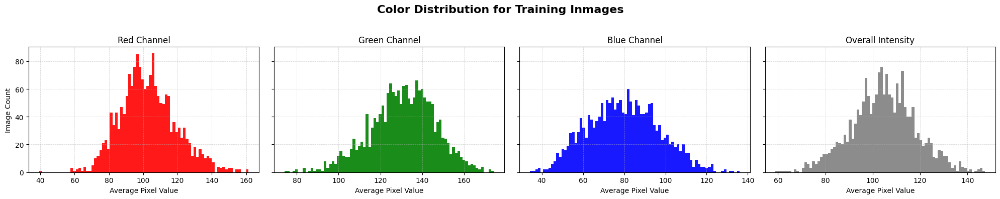

In [20]:
display_color_distributions(train, 'Color Distribution for Training Inmages')

100%|██████████| 1821/1821 [00:56<00:00, 31.99it/s]


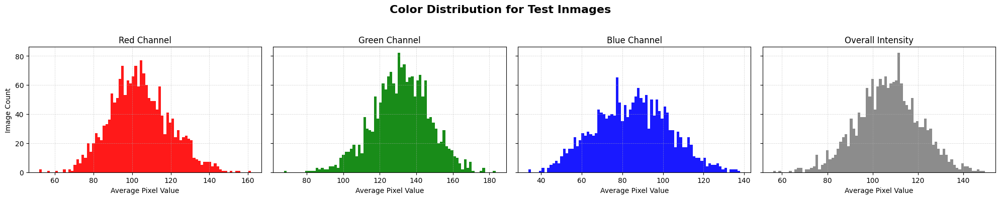

In [21]:
display_color_distributions(test, 'Color Distribution for Test Inmages')

## Displaying leaf samples

In [22]:
def display_leaf_samples(cond=[0, 0, 0, 0], cond_cols=["healthy"], is_cond=True):
    def format_condition():
        conditions = {
            "healthy": f"healthy == {cond[0]}",
            "scab": f"scab == {cond[1]}",
            "rust": f"rust == {cond[2]}",
            "multiple_diseases": f"multiple_diseases == {cond[3]}"
        }
        return [conditions[c] for c in cond_cols]

    if not is_cond:
        imgs = train_images.iloc[-15:]
        title_text = "Random Sample of Leaf Images"
    else:
        filtered = train.head(101)
        for c in format_condition():
            filtered = filtered.query(c)
        imgs = train_images.loc[filtered.index].head(15)
        title_text = " | ".join(cond_cols).replace("_", " ").title() + " Leaves"

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()

    for i, ax in enumerate(axes):
        if i < len(imgs):
            ax.imshow(imgs.iloc[i])
            ax.set_title(f"Image #{imgs.index[i]}", fontsize=12)
        ax.axis('off')

    plt.suptitle(title_text, fontsize=16, weight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


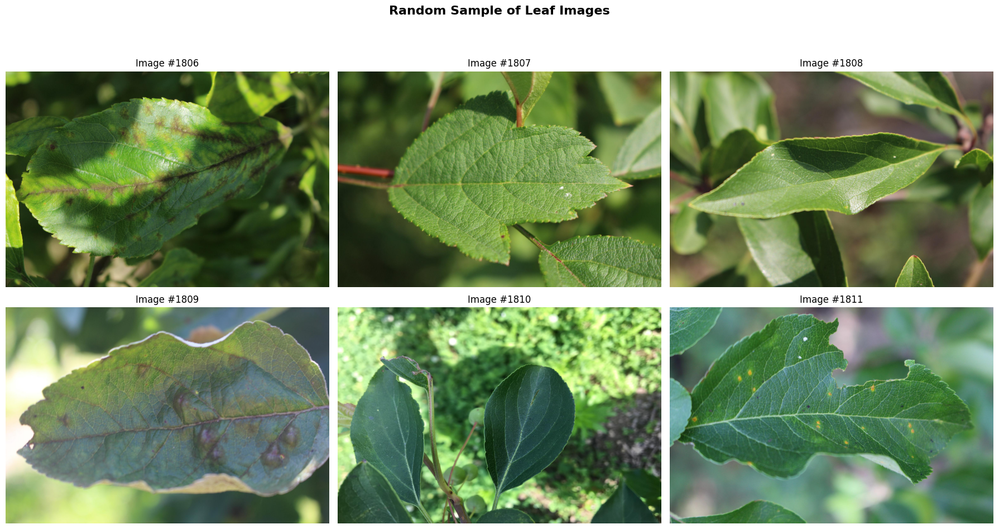

In [23]:
display_leaf_samples(is_cond=False)

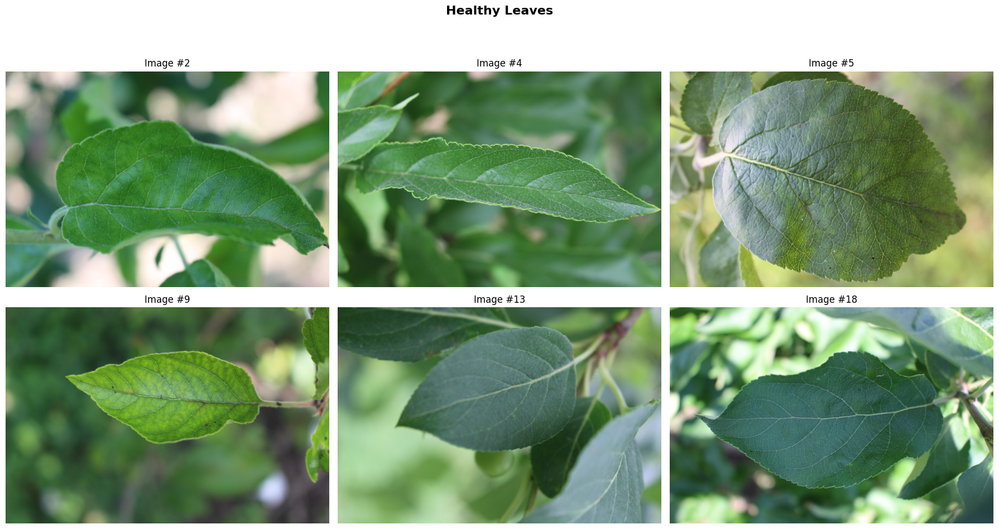

In [24]:
display_leaf_samples(cond=[1, 0, 0, 0], cond_cols=["healthy"])

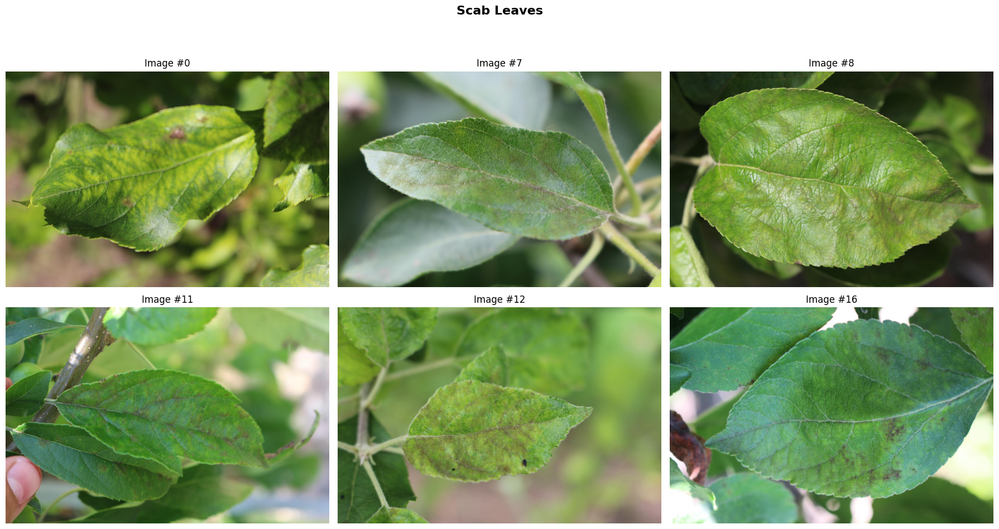

In [25]:
display_leaf_samples(cond=[0, 1, 0, 0], cond_cols=["scab"])

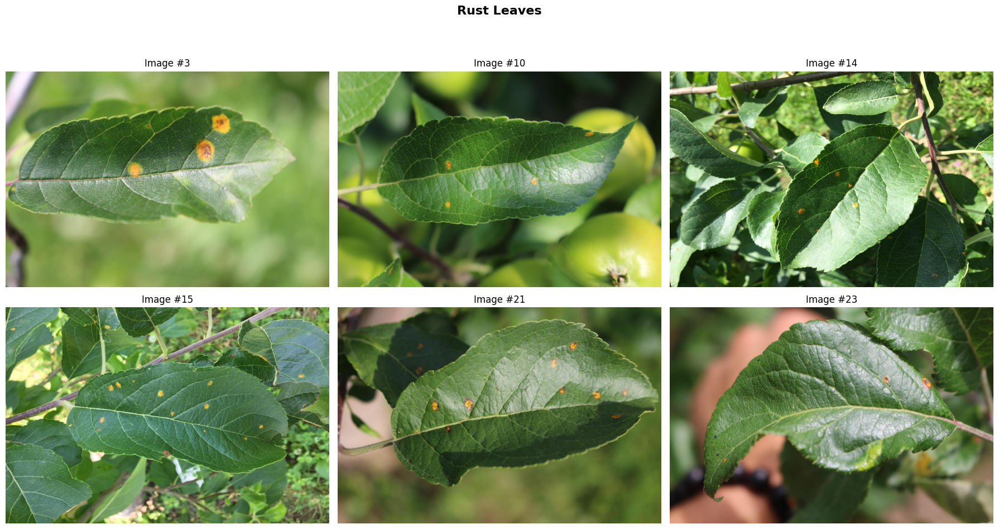

In [26]:
display_leaf_samples(cond=[0, 0, 1, 0], cond_cols=["rust"])

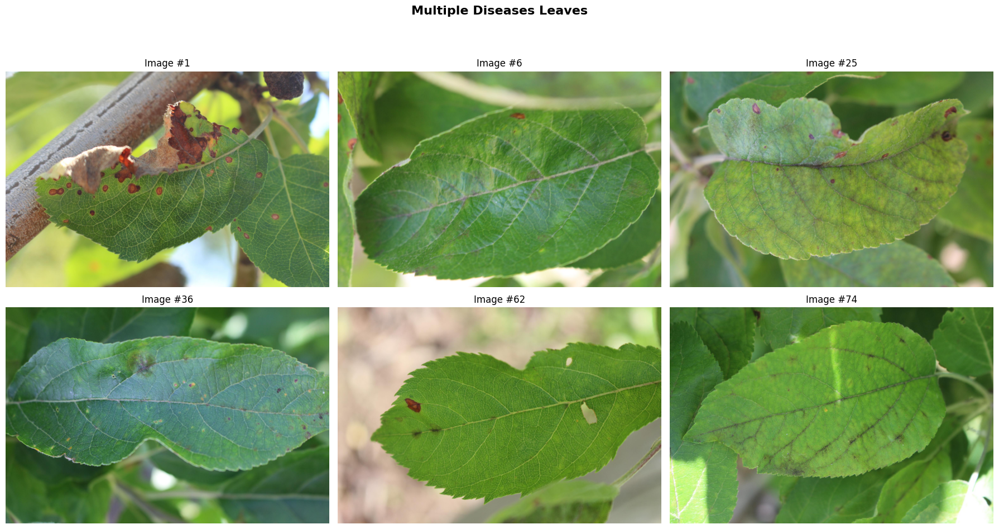

In [27]:
display_leaf_samples(cond=[0, 0, 0, 1], cond_cols=["multiple_diseases"])

## Feature Extraction

In [28]:
def extract_color_histogram(image, bins=(8, 8, 8)):
    hist = cv2.calcHist([image], [0, 1, 2], None, bins, [0, 256, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

In [29]:
def extract_features(df, image_folder):
    features = []
    for _, row in tqdm(df.iterrows(), total=len(df)):
        image_path = os.path.join(image_folder, row.image_id + '.jpg')
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        hist = extract_color_histogram(image)
        features.append(hist)
    return np.array(features)

In [31]:
train_features = extract_features(train, folder_path)
test_features = extract_features(test, folder_path)

100%|██████████| 1821/1821 [00:31<00:00, 57.11it/s]


In [32]:
LABEL_COLS = ['healthy', 'multiple_diseases', 'rust', 'scab']
train['label'] = train[LABEL_COLS].idxmax(axis=1)

In [33]:
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
lb = LabelBinarizer()
train_labels = lb.fit_transform(train['label'])

## SVM

In [34]:
X_train, X_val, y_train, y_val = train_test_split(train_features, train_labels, test_size=0.33, random_state=101)

In [35]:
y_train = y_train.argmax(axis=1)
y_val = y_val.argmax(axis=1)

In [36]:
svm_model = SVC(kernel='linear', probability=True)
svm_model.fit(X_train, y_train)

SVC(kernel='linear', probability=True)

In [37]:
val_preds = svm_model.predict(X_val)

In [38]:
accuracy = accuracy_score(y_val, val_preds)
print(f"Validation Accuracy: {accuracy}")

Validation Accuracy: 0.5108153078202995


In [39]:
print(classification_report(y_val, val_preds, target_names=lb.classes_))

                   precision    recall  f1-score   support

          healthy       0.55      0.46      0.50       181
multiple_diseases       0.00      0.00      0.00        29
             rust       0.54      0.47      0.50       212
             scab       0.47      0.69      0.56       179

         accuracy                           0.51       601
        macro avg       0.39      0.41      0.39       601
     weighted avg       0.50      0.51      0.49       601



C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [40]:
test_preds = svm_model.predict(test_features)

In [41]:
test_labels = lb.classes_[test_preds]

In [42]:
svm_model = SVC(kernel='rbf', probability=True)
svm_model.fit(X_train, y_train)

SVC(probability=True)

In [43]:
val_preds = svm_model.predict(X_val)

In [44]:
accuracy = accuracy_score(y_val, val_preds)
print(f"Validation Accuracy: {accuracy}")

Validation Accuracy: 0.5557404326123128


In [45]:
print(classification_report(y_val, val_preds, target_names=lb.classes_))

                   precision    recall  f1-score   support

          healthy       0.60      0.53      0.56       181
multiple_diseases       0.00      0.00      0.00        29
             rust       0.56      0.55      0.56       212
             scab       0.52      0.68      0.59       179

         accuracy                           0.56       601
        macro avg       0.42      0.44      0.43       601
     weighted avg       0.53      0.56      0.54       601



C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [46]:
svm_model = SVC(kernel='poly', probability=True)
svm_model.fit(X_train, y_train)

SVC(kernel='poly', probability=True)

In [47]:
val_preds = svm_model.predict(X_val)

In [48]:
accuracy = accuracy_score(y_val, val_preds)
print(f"Validation Accuracy: {accuracy}")

Validation Accuracy: 0.562396006655574


In [49]:
print(classification_report(y_val, val_preds, target_names=lb.classes_))

                   precision    recall  f1-score   support

          healthy       0.62      0.53      0.57       181
multiple_diseases       0.00      0.00      0.00        29
             rust       0.57      0.58      0.57       212
             scab       0.52      0.67      0.58       179

         accuracy                           0.56       601
        macro avg       0.43      0.44      0.43       601
     weighted avg       0.54      0.56      0.55       601



C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\HP\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



SVM performs the best when the polynomial kernel is used

In [50]:
test_preds = svm_model.predict(test_features)
test_labels = lb.classes_[test_preds]

In [51]:
submission = pd.DataFrame({'image_id': test['image_id'], 'label': test_labels})
submission.to_csv('submission.csv', index=False)

In [52]:
from sklearn.preprocessing import StandardScaler
def extract_raw_pixels(image, size=(64, 64)):
    resized_image = cv2.resize(image, size)
    return resized_image.flatten()

def extract_features(df, image_folder, size=(64, 64)):
    features = []
    for _, row in tqdm(df.iterrows(), total=len(df)):
        image_path = os.path.join(image_folder, row.image_id + '.jpg')
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        pixels = extract_raw_pixels(image, size)
        features.append(pixels)
    return np.array(features)

train_features = extract_features(train, folder_path)
test_features = extract_features(test, folder_path)

100%|██████████| 1821/1821 [00:19<00:00, 93.86it/s]


In [53]:
subset_size = 1000  # Choose a suitable size
subset_indices = np.random.choice(train_features.shape[0], subset_size, replace=False)
subset_features = train_features[subset_indices]

In [54]:
scaler = StandardScaler()
scaler.fit(subset_features)

StandardScaler()

In [55]:
train_features = scaler.transform(train_features)
test_features = scaler.transform(test_features)

In [56]:
LABEL_COLS = ['healthy', 'multiple_diseases', 'rust', 'scab']
train['label'] = train[LABEL_COLS].idxmax(axis=1)

In [57]:
lb = LabelBinarizer()
train_labels = lb.fit_transform(train['label'])

In [58]:
X_train, X_val, y_train, y_val = train_test_split(train_features, train_labels, test_size=0.33, random_state=101)
y_train = y_train.argmax(axis=1)
y_val = y_val.argmax(axis=1)
svm_model = SVC(kernel='linear', probability=True)
svm_model.fit(X_train, y_train)
val_preds = svm_model.predict(X_val)

In [59]:
accuracy = accuracy_score(y_val, val_preds)
print(f"Validation Accuracy: {accuracy}")

Validation Accuracy: 0.39933444259567386


In [60]:
print(classification_report(y_val, val_preds, target_names=lb.classes_))
test_preds = svm_model.predict(test_features)
test_labels = lb.classes_[test_preds]

                   precision    recall  f1-score   support

          healthy       0.40      0.43      0.41       181
multiple_diseases       0.07      0.03      0.05        29
             rust       0.45      0.37      0.41       212
             scab       0.38      0.47      0.42       179

         accuracy                           0.40       601
        macro avg       0.32      0.32      0.32       601
     weighted avg       0.40      0.40      0.39       601



Using only pixel

In [62]:
X_train, X_val, y_train, y_val = train_test_split(train_features, train_labels, test_size=0.33, random_state=101)
y_train = y_train.argmax(axis=1)
y_val = y_val.argmax(axis=1)

In [63]:
svm_model = SVC(kernel='poly', probability=True)
svm_model.fit(X_train, y_train)
val_preds = svm_model.predict(X_val)

In [64]:
accuracy = accuracy_score(y_val, val_preds)
print(f"Accuracy: {accuracy}")

Accuracy: 0.3544093178036606


When using raw pixel

## Random Forest 

In [65]:
from sklearn.ensemble import RandomForestClassifier
def extract_color_histogram(image, bins=(8, 8, 8)):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    hist = cv2.calcHist([hsv], [0, 1, 2], None, bins, [0, 180, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    return hist.flatten()

def extract_features(df, image_folder):
    features = []
    for _, row in tqdm(df.iterrows(), total=len(df)):
        image_path = os.path.join(image_folder, row.image_id + '.jpg')
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        hist = extract_color_histogram(image)
        features.append(hist)
    return np.array(features)

train_features = extract_features(train, folder_path)
test_features = extract_features(test, folder_path)

100%|██████████| 1821/1821 [00:32<00:00, 56.32it/s]


In [66]:
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

In [67]:
LABEL_COLS = ['healthy', 'multiple_diseases', 'rust', 'scab']
train['label'] = train[LABEL_COLS].idxmax(axis=1)

In [68]:
lb = LabelBinarizer()
train_labels = lb.fit_transform(train['label'])

In [69]:
X_train, X_val, y_train, y_val = train_test_split(train_features, train_labels, test_size=0.33, random_state=101)

In [70]:
y_train = y_train.argmax(axis=1)
y_val = y_val.argmax(axis=1)
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [71]:
val_preds = rf_model.predict(X_val)
accuracy = accuracy_score(y_val, val_preds)
print(f"Validation Accuracy: {accuracy}")
print(classification_report(y_val, val_preds, target_names=lb.classes_))

Validation Accuracy: 0.800332778702163
                   precision    recall  f1-score   support

          healthy       0.79      0.76      0.77       181
multiple_diseases       0.00      0.00      0.00        29
             rust       0.89      0.94      0.92       212
             scab       0.72      0.80      0.76       179

         accuracy                           0.80       601
        macro avg       0.60      0.63      0.61       601
     weighted avg       0.76      0.80      0.78       601



In [72]:
from sklearn.ensemble import RandomForestClassifier

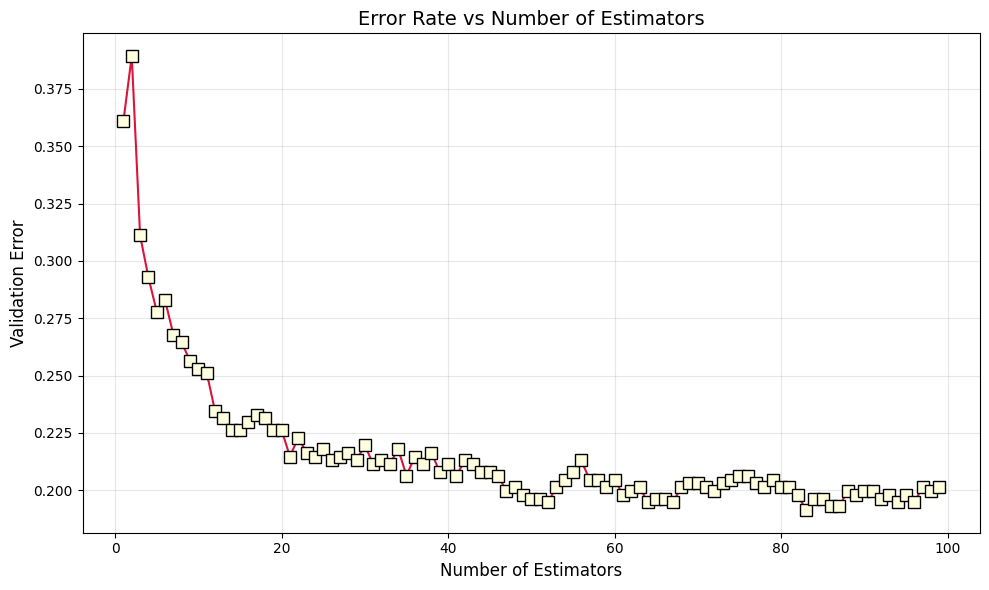

In [74]:
error_rate = []
for i in range(1, 100):
    rfc = RandomForestClassifier(n_estimators=i, random_state=42)
    rfc.fit(X_train, y_train)
    pred_i = rfc.predict(X_val)
    error_rate.append(np.mean(pred_i != y_val))

plt.figure(figsize=(10, 6))
plt.plot(range(1, 100), error_rate,
         color='crimson', linestyle='-', marker='s',
         markerfacecolor='lightyellow', markeredgecolor='black', markersize=8)

plt.title('Error Rate vs Number of Estimators', fontsize=14)
plt.xlabel('Number of Estimators', fontsize=12)
plt.ylabel('Validation Error', fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [75]:
test_preds = rf_model.predict(test_features)
test_labels = lb.classes_[test_preds]

In [76]:
submission = pd.DataFrame({'image_id': test['image_id'], 'label': test_labels})
submission.to_csv('submissionrfc.csv', index=False)

## Gradient Boosting Classifier

In [77]:
from sklearn.ensemble import GradientBoostingClassifier

In [78]:
def extract_color_histogram(image, bins=(8, 8, 8)):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    hist = cv2.calcHist([hsv], [0, 1, 2], None, bins, [0, 180, 0, 256, 0, 256])
    cv2.normalize(hist, hist)
    return hist.flatten()

def extract_features(df, image_folder):
    features = []
    for _, row in tqdm(df.iterrows(), total=len(df)):
        image_path = os.path.join(image_folder, row.image_id + '.jpg')
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        hist = extract_color_histogram(image)
        features.append(hist)
    return np.array(features)

train_features = extract_features(train, folder_path)
test_features = extract_features(test, folder_path)

100%|██████████| 1821/1821 [00:31<00:00, 58.31it/s]


In [79]:
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)
test_features = scaler.transform(test_features)

In [80]:
LABEL_COLS = ['healthy', 'multiple_diseases', 'rust', 'scab']
train['label'] = train[LABEL_COLS].idxmax(axis=1)
lb = LabelBinarizer()
train_labels = lb.fit_transform(train['label'])
X_train, X_val, y_train, y_val = train_test_split(train_features, train_labels, test_size=0.33, random_state=101)

In [81]:
y_train = np.argmax(y_train, axis=1)
y_val = np.argmax(y_val, axis=1)

In [82]:
y_train = y_train
y_val = y_val
gbm_model = GradientBoostingClassifier(n_estimators=400, random_state=42)
gbm_model.fit(X_train, y_train)

GradientBoostingClassifier(n_estimators=400, random_state=42)

In [83]:
val_preds = gbm_model.predict(X_val)

In [84]:
accuracy = accuracy_score(y_val, val_preds)
print(f"Validation Accuracy: {accuracy}")
print(classification_report(y_val, val_preds, target_names=lb.classes_))

Validation Accuracy: 0.7903494176372712
                   precision    recall  f1-score   support

          healthy       0.76      0.73      0.75       181
multiple_diseases       0.50      0.17      0.26        29
             rust       0.93      0.92      0.92       212
             scab       0.69      0.80      0.74       179

         accuracy                           0.79       601
        macro avg       0.72      0.66      0.67       601
     weighted avg       0.79      0.79      0.78       601



In [85]:
test_preds = gbm_model.predict(test_features)
test_labels = lb.classes_[test_preds]
submission = pd.DataFrame({'image_id': test['image_id'], 'label': test_labels})
submission.to_csv('submissiongbm.csv', index=False)

## Buidling Pickl files

In [86]:
import pickle

with open('scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

with open('label_binarizer.pkl', 'wb') as f:
    pickle.dump(lb, f)

with open('rf_model.pkl', 'wb') as f:
    pickle.dump(rf_model, f)
